*Nguyễn Phúc Minh Long - 18110137*
# Lab 02: Image Processing and Analysis

In [1]:
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
from pylab import imread
from skimage.color import rgb2gray

In [2]:
def imshows(ImageData, LabelData, rows, cols, gridType=False):
    # Convert ImageData and LabelData to list
    ImageArray = list(ImageData)
    LabelArray = list(LabelData)
    if (rows == 1 & cols == 1):
        fig = plt.figure(figsize=(20,20))
    else: 
        fig = plt.figure(figsize=(cols*8, rows*5))
    for i in range (1, rows * cols + 1):
        fig.add_subplot(rows, cols, i)
        image = ImageArray[i - 1]
        # If the channel number is less than 3, we display as grayscale image
        # otherwise, we display as color image
        if (len(image.shape) < 3):
            plt.imshow(image, plt.cm.gray)
        else:
            plt.imshow(image)
        plt.grid(gridType)
        plt.title(LabelArray[i - 1])
    plt.show()
    
def ShowThreeImages(IM1, IM2, IM3, LB1="Image 1", LB2="Image 2", LB3="Image 3"):
    imshows([IM1, IM2, IM3], [LB1, LB2, LB3], 1, 3)
    
def ShowTwoImages(IM1, IM2, LB1="Image 1", LB2="Image 2"):
    imshows([IM1, IM2], [LB1, LB2], 1, 2)
    
def ShowOneImage(IM, LB="Image"):
    imshows([IM], [LB], 1, 1)
    
def ShowListImages(listImage, row, col, listCaption=['a']):
    if len(listImage) != len(listCaption):
        listCaption = []
        for i in range(len(listImage)):
            listCaption.append(str(i))
    imshows(listImage,listCaption,row,col)

## Exercise 1 - Chọn 1 ảnh từ internet bất kỳ và thực hiện các thao tác:

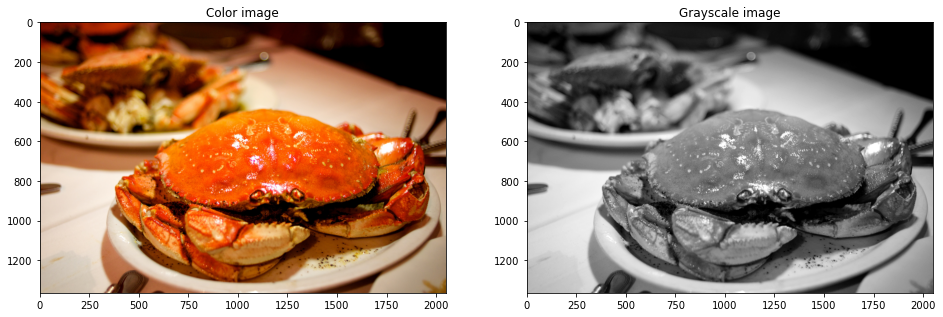

In [3]:
# Read image
img_color = imread("Image/Crab.jpg")

#Convert image into gray 
img_gray = cv2.cvtColor(img_color, cv2.COLOR_RGB2GRAY)

#Display image
ShowTwoImages(img_color, img_gray, "Color image", "Grayscale image")

### a) Viết thành một function cho biết thông tin của bức ảnh : Ảnh màu hay ảnh xám và giá trị min max tương ứng với từng kênh màu

In [4]:
# Function to show information of image
def ShowInfo(image):
    img = image.copy()
    width = img.shape[1]
    height = img.shape[0]
    channel = len(img.shape)
    print(f"   Width: {width} | Height: {height} | Channel: {channel}")
    if (channel == 2):
        print(f"   Min intensity: {img.min()} | Max intensity: {img.max()}")
    else:
        print(f"   Red   - Min intensity: {img[:,:,0].min()} | Max intensity: {img[:,:,0].max()}")
        print(f"   Green - Min intensity: {img[:,:,1].min()} | Max intensity: {img[:,:,1].max()}")
        print(f"   Blue  - Min intensity: {img[:,:,2].min()} | Max intensity: {img[:,:,2].max()}")
        
#Show information of color image
print("Information of color image:")
ShowInfo(img_color)

#Show information of gray image
print("\nInformation of gray image:")
ShowInfo(img_gray)

Information of color image:
   Width: 2048 | Height: 1365 | Channel: 3
   Red   - Min intensity: 0 | Max intensity: 255
   Green - Min intensity: 0 | Max intensity: 255
   Blue  - Min intensity: 0 | Max intensity: 255

Information of gray image:
   Width: 2048 | Height: 1365 | Channel: 2
   Min intensity: 0 | Max intensity: 255


### b) Hiển thị 24 bức ảnh theo bit của từng kênh màu R, G, B (mỗi kênh 8 ảnh x 3 kênh = 24 ảnh bit)

List of Red channel have  8  images


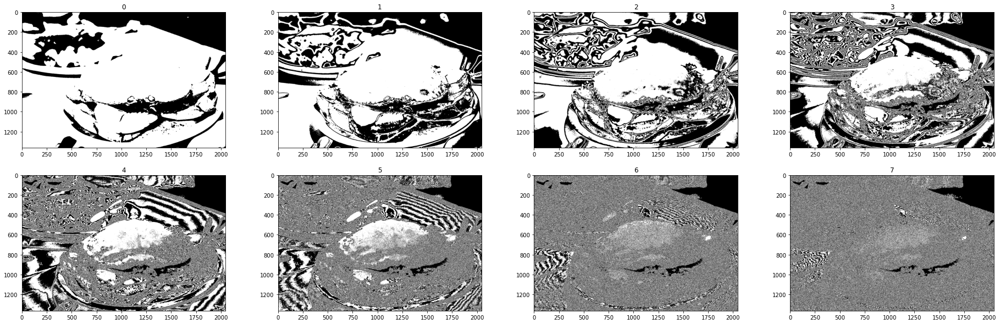

List of Green channel have  8  images


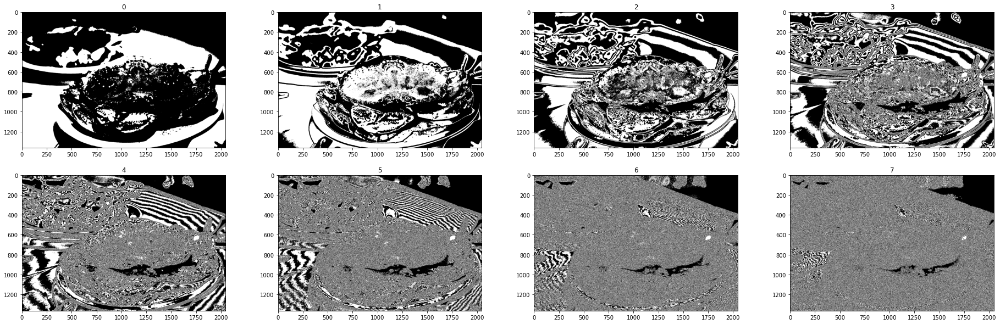

List of Blue channel have  8  images


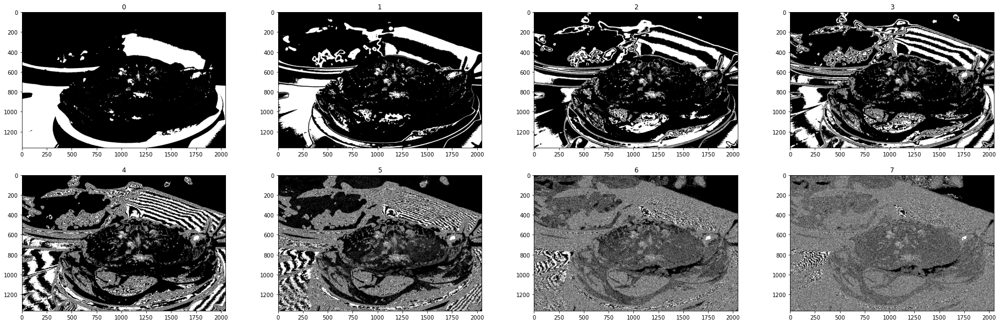

In [5]:
def intToBitArray(img):
    row, col = img.shape
    list = []
    for i in range(row):
        for j in range(col):
            list.append (np.binary_repr(img[i][j], width=8))
    return list #the binary_repr() fucntion returns binary values but in
                #string
                #, not integer, which has it's own perk as you will notice
        
def bitplane(bitImgVal, img1D):
    bitList = [int(i[bitImgVal]) for i in img1D]
    return bitList

def GetBitImage(index, image2D):
    ImageIn1D = intToBitArray(image2D)
    Imagebit = np.array(bitplane(index, ImageIn1D))
    Imagebit = np.reshape(Imagebit, image2D.shape)
    return Imagebit

def GetAllBitImage(image2D):
    image2D_Bit = list()
    for i in range(8):
        image2D_Bit.append(GetBitImage(i, image2D))
    return image2D_Bit

# Get 8 Mask Image corresponding to 8 bit of Red channel
image2D_Bit_R = GetAllBitImage(img_color[:,:,0])

print("List of Red channel have ", len(image2D_Bit_R), " images")
ShowListImages(image2D_Bit_R, 2, 4)

# Get 8 Mask Image corresponding to 8 bit of Green channel
image2D_Bit_G = GetAllBitImage(img_color[:,:,1])

print("List of Green channel have ", len(image2D_Bit_G), " images")
ShowListImages(image2D_Bit_G, 2, 4)

# Get 8 Mask Image corresponding to 8 bit of Blue channel
image2D_Bit_B = GetAllBitImage(img_color[:,:,2])

print("List of Blue channel have ", len(image2D_Bit_B), " images")
ShowListImages(image2D_Bit_B, 2, 4)

### c) Hiển thị 24 bức ảnh theo bit của từng kênh màu H, S, V (mỗi kênh 8 ảnh x 3 kênh = 24 ảnh bit)

List of Hue channel have  8  images


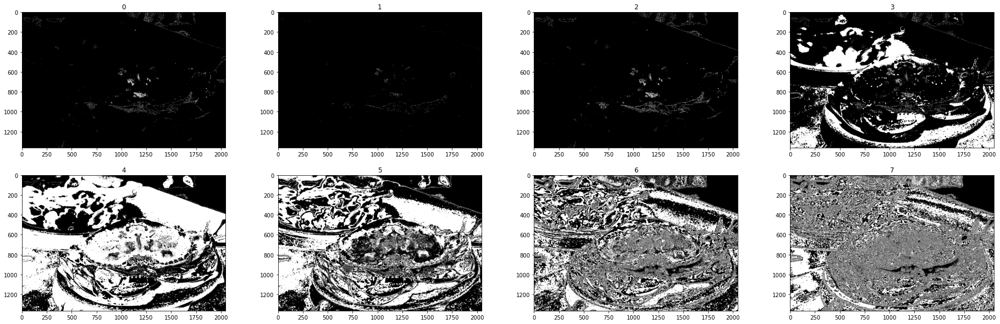

List of Saturation channel have  8  images


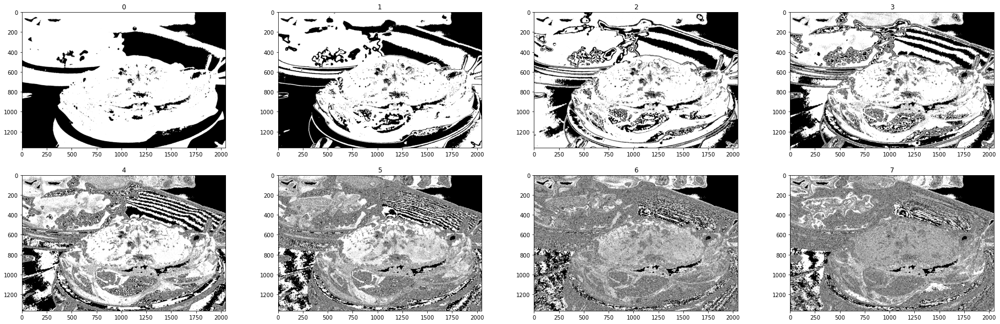

List of Value channel have  8  images


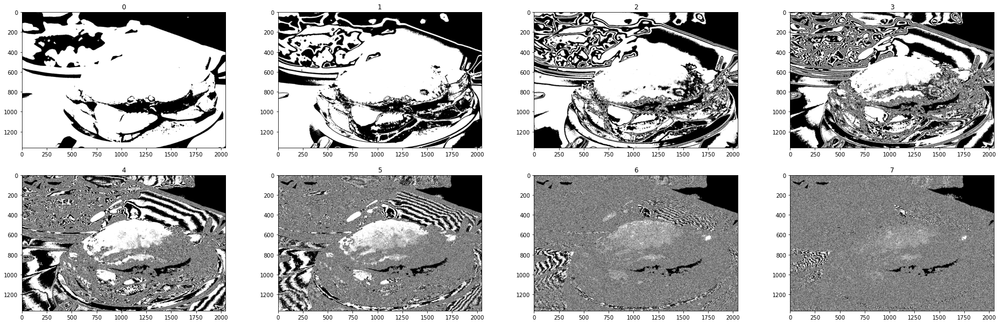

In [6]:
# Convert RGB to HSV
img_hsv = cv2.cvtColor(img_color, cv2.COLOR_RGB2HSV)

# Get 8 Mask Image corresponding to 8 bit of Hue channel
image2D_Bit_H = GetAllBitImage(img_hsv[:,:,0])

print("List of Hue channel have ", len(image2D_Bit_H), " images")
ShowListImages(image2D_Bit_H, 2, 4)

# Get 8 Mask Image corresponding to 8 bit of Saturation channel
image2D_Bit_S = GetAllBitImage(img_hsv[:,:,1])

print("List of Saturation channel have ", len(image2D_Bit_S), " images")
ShowListImages(image2D_Bit_S, 2, 4)

# Get 8 Mask Image corresponding to 8 bit of Value channel
image2D_Bit_V = GetAllBitImage(img_hsv[:,:,2])

print("List of Value channel have ", len(image2D_Bit_V), " images")
ShowListImages(image2D_Bit_V, 2, 4)

### d) Cho biết trong 24 ảnh bit theo kênh R, G, B có ảnh nào có thể dùng để trích xuất đối tượng hay không. Nếu có thì hiển thị ảnh bit đó ra

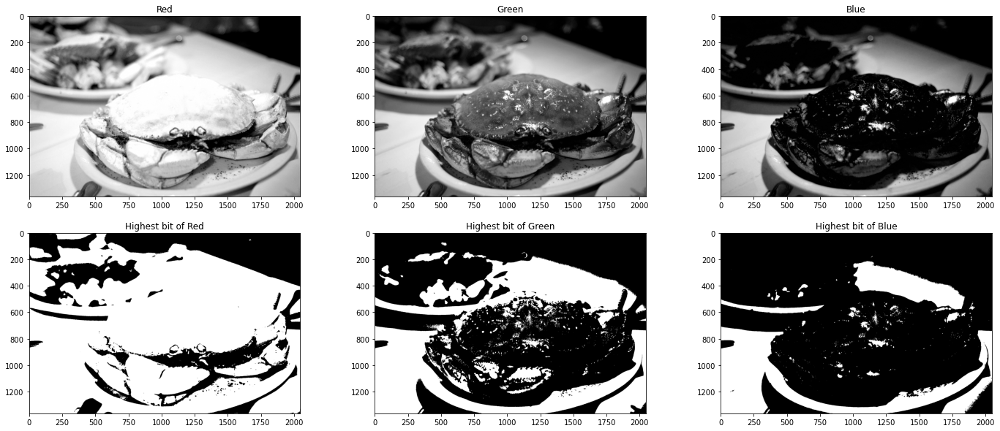

In [7]:
# Take the highest bit image of R list
CellMask_R = image2D_Bit_R[0]
# Take the highest bit image of G list
CellMask_G = image2D_Bit_G[0]
# Take the highest bit image of B list
CellMask_B = image2D_Bit_B[0]
ShowListImages([img_color[:,:,0], img_color[:,:,1], img_color[:,:,2], CellMask_R, CellMask_G, CellMask_B], 2, 3, ["Red","Green","Blue","Highest bit of Red","Highest bit of Green","Highest bit of Blue"])

In [8]:
def SegmentColorImageByMask(IM, Mask):
    Mask = Mask.astype(np.uint8)
    result = cv2.bitwise_and(IM, IM, mask = Mask)
    return result

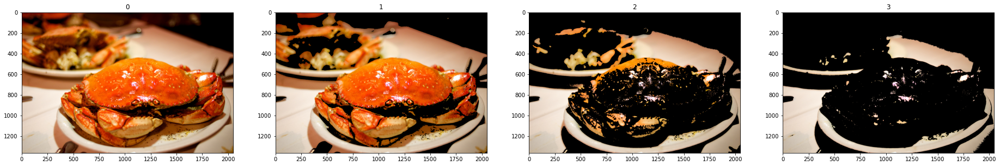

In [9]:
CellMask_R_rgb = SegmentColorImageByMask(img_color, CellMask_R)
CellMask_G_rgb = SegmentColorImageByMask(img_color, CellMask_G)
CellMask_B_rgb = SegmentColorImageByMask(img_color, CellMask_B)
ShowListImages([img_color, CellMask_R_rgb, CellMask_G_rgb, CellMask_B_rgb], 1, 4)

### d) Cho biết trong 24 ảnh bit theo kênh H, S, V có ảnh nào có thể dùng để trích xuất đối tượng hay không. Nếu có thì hiển thị ảnh bit đó ra

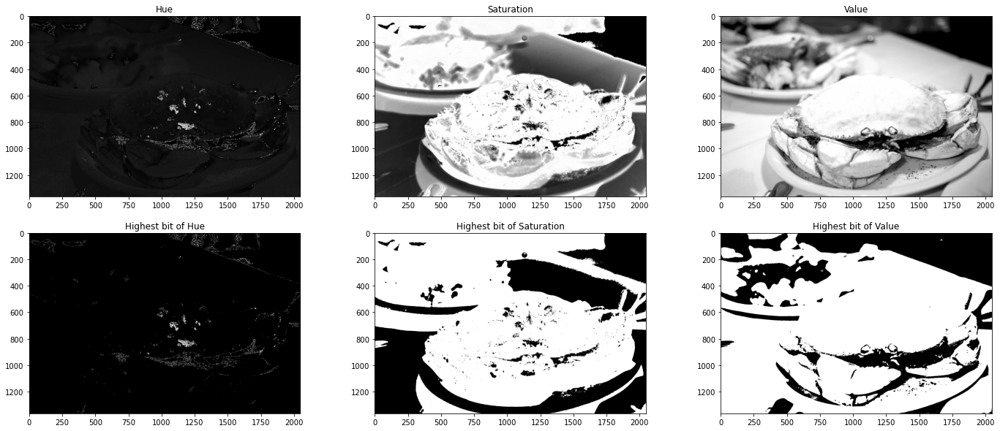

In [10]:
# Take the highest bit image of H list
CellMask_H = image2D_Bit_H[0]
# Take the highest bit image of S list
CellMask_S = image2D_Bit_S[0]
# Take the highest bit image of V list
CellMask_V = image2D_Bit_V[0]
ShowListImages([img_hsv[:,:,0], img_hsv[:,:,1], img_hsv[:,:,2], CellMask_H, CellMask_S, CellMask_V], 2, 3, ["Hue","Saturation","Value","Highest bit of Hue","Highest bit of Saturation","Highest bit of Value"])

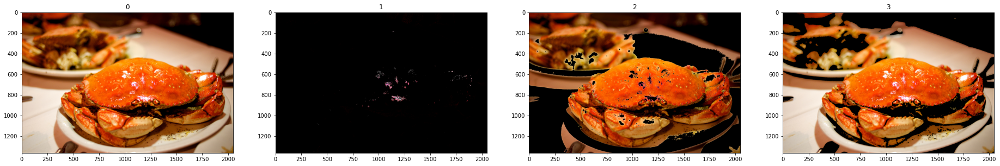

In [11]:
CellMask_H_rgb = SegmentColorImageByMask(img_color, CellMask_H)
CellMask_S_rgb = SegmentColorImageByMask(img_color, CellMask_S)
CellMask_V_rgb = SegmentColorImageByMask(img_color, CellMask_V)
ShowListImages([img_color, CellMask_H_rgb, CellMask_S_rgb, CellMask_V_rgb], 1, 4)

## Exercise 2 - Chọn một bức ảnh có nhiều mặt người trên internet và thực hiện các thao tác:
### a) Viết 1 function input ảnh màu và xuất ảnh chân dung xám và chân dung màu của ảnh đó

Image Size: (2320, 3088, 3)


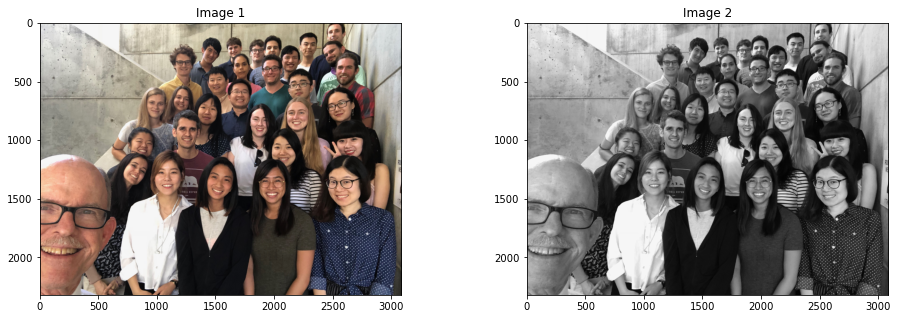

In [12]:
# Read Image
img_color = imread("Image/People.jpeg")

# Convert Image into Gray
img_gray = cv2.cvtColor(img_color, cv2.COLOR_RGB2GRAY)

# Display Image
print("Image Size:", img_color.shape)
ShowTwoImages(img_color, img_gray)

### b) Tìm chọn range màu lower và upper để trích xuất được các khuôn mặt trong ảnh màu

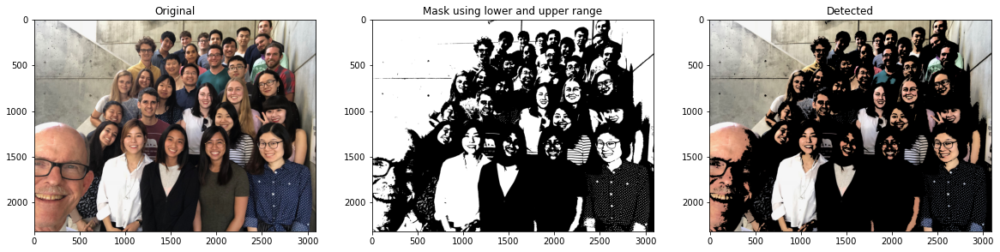

In [13]:
# Get color by range color in RGB from [0,0,100] to [255,255,255]

lower = np.array([0,0,100])
upper = np.array([255,255,255])
CellMask = cv2.inRange(img_color, lower, upper)
CellMask_rgb = SegmentColorImageByMask(img_color, CellMask)
ShowThreeImages(img_color, CellMask, CellMask_rgb, "Original", "Mask using lower and upper range", "Detected")

## Exercise 3 - Chọn một bức ảnh từ internet về 1 đồ vật và thực hiện các thao tác:

Image Size: (2000, 2000, 3)


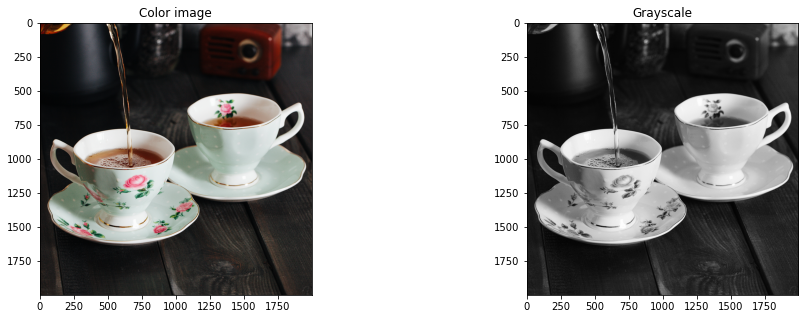

In [14]:
# Read Image
img_color = imread("Image/Teacup.jpg")

# Convert Image into Gray
img_gray = cv2.cvtColor(img_color, cv2.COLOR_RGB2GRAY)

# Display Image
print("Image Size:", img_color.shape)
ShowTwoImages(img_color, img_gray, "Color image", "Grayscale")

### a) Xuất ảnh xoay các góc 30, 45, 60 độ

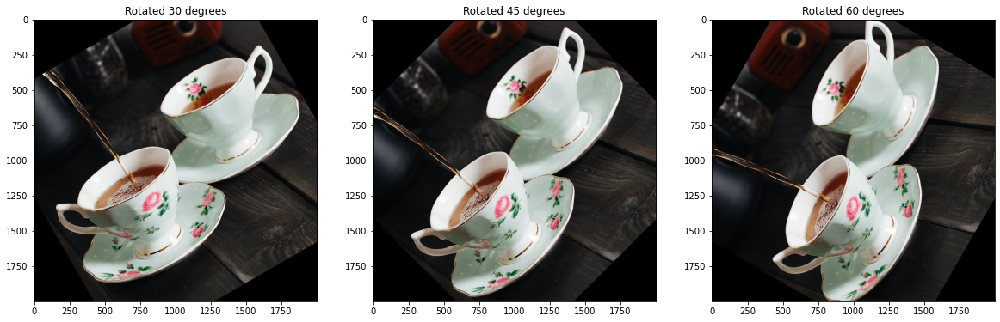

In [15]:
from skimage.transform import rotate
img_color_rotate_30 = rotate(img_color, 30)
img_color_rotate_45 = rotate(img_color, 45)
img_color_rotate_60 = rotate(img_color, 60)
ShowThreeImages(img_color_rotate_30, img_color_rotate_45, img_color_rotate_60, "Rotated 30 degrees", "Rotated 45 degrees","Rotated 60 degrees")

### b) Xuất ảnh đối xứng qua trục hoành và trục tung đi qua tâm ảnh

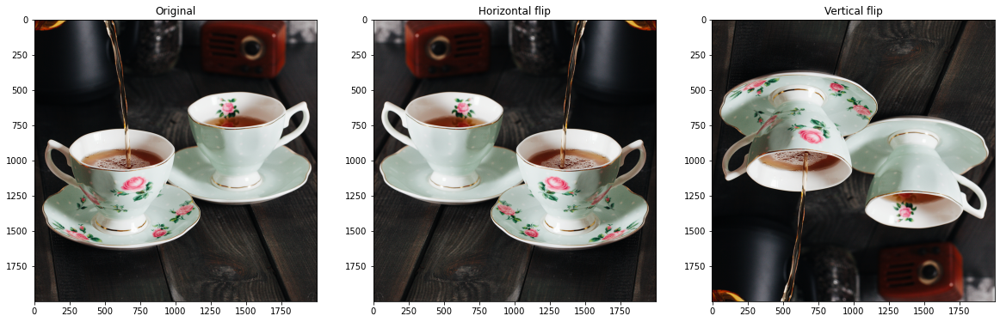

In [16]:
img_color_horizontal_flip = img_color[:, ::-1]
img_color_vertical_flip = img_color[::-1, :]
ShowThreeImages(img_color, img_color_horizontal_flip, img_color_vertical_flip, "Original", "Horizontal flip", "Vertical flip")

### c) Xuất ảnh inversion

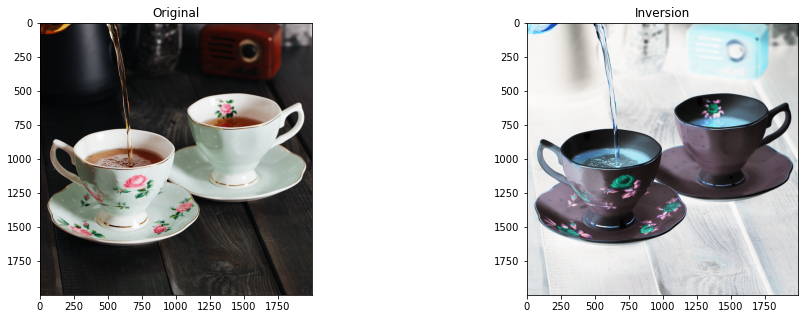

In [17]:
from skimage import util
img_color_inversion = util.invert(img_color)
ShowTwoImages(img_color, img_color_inversion, "Original", "Inversion")

### d) Xuất ảnh enhance contrast

10.0 211.0


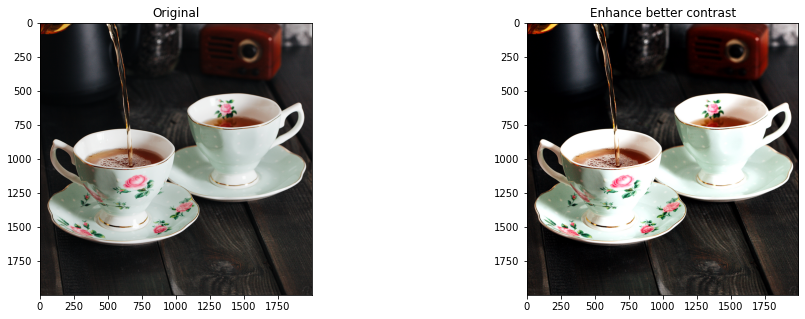

In [18]:
import numpy as np
from skimage import exposure

# take from 10 to 90 percent of color range
v_min, v_max = np.percentile(img_color, (10, 90))
better_contrast = exposure.rescale_intensity(img_color, in_range=(v_min, v_max))

print(v_min, v_max)
ShowTwoImages(img_color, better_contrast, "Original", "Enhance better contrast")

### e) Xuất ảnh gamma và log enhancement

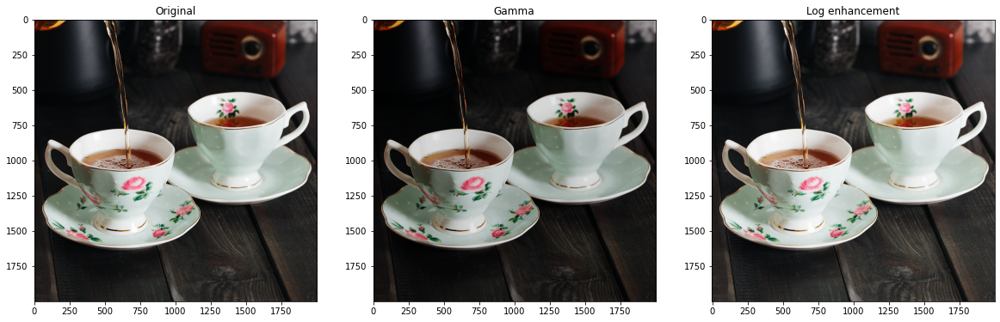

In [19]:
# gamma and gain parameters are between 0 and 1
adjusted_gamma_image = exposure.adjust_gamma(img_color, gamma=1.2, gain=0.9)

# Logarithmic corrected
log_correction_image = exposure.adjust_log(img_color)

#Display
ShowThreeImages(img_color, adjusted_gamma_image, log_correction_image, "Original", "Gamma", "Log enhancement")